## Integrated Pulmonary Fibrosis (PF) cell atlas: immune cell subset

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
from matplotlib import rcParams

# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.verbosity = 3               
sc.logging.print_version_and_date()

# making sure plots & clusters are reproducible
np.random.seed(42)

# custom functions
import sc_toolbox as sct

Running Scanpy 1.8.2, on 2023-01-02 14:42.


In [2]:
## path variables
adata_dir = '/home/niklas/data/210514_IPF_atlas_human/210611_in_vivo_reference_NIKLAS.h5ad'
project_dir = '/home/niklas/projects/niche_environments_FIBROSIS/IPF_cell_atlas_reference_CPC/01_data/marker_table/'

In [3]:
## plotting variables
sc.settings.figdir = '/home/niklas/projects/niche_environments_FIBROSIS/HUMAN_invivo/02_figures/immune_subset/'
sc.set_figure_params(vector_friendly = True)
plt.rcParams['figure.figsize'] = (8, 8)
plt.rcParams['pdf.fonttype'] = 42

In [4]:
## load anndata object
adata = sc.read(adata_dir)

In [5]:
## have a look at the adata object: 559936 cells
adata

AnnData object with n_obs × n_vars = 559936 × 61661
    obs: 'data_set', 'disease', 'enriched', 'health_state', 'in_integrated', 'name', 'patient', 'identifier', 'n_counts', 'n_genes', 'percent_mito', 'QC_group', 'doublet_scores', 'size_factors', 'S_score', 'G2M_score', 'phase', 'louvain_1', 'louvain_2', 'domain', 'cell_type', 'meta_celltype', 'patient_id', 'disease_long', 'age', 'age_status', 'gender', 'internal_id', 'smoke_status', 'ever_smoker', 'published_cell_type', 'published_category', 'integrated', 'disease_patient', 'dge_celltype', 'cell_type_group', 'cell_type_niklas'
    var: 'mean-0', 'std-0', 'mean-1', 'std-1', 'mean-2', 'std-2', 'mean-3', 'std-3', 'mean-4', 'std-4', 'highly_variable'
    uns: 'cell_type_colors', 'cell_type_group_colors', 'cell_type_niklas_colors', 'data_set_colors', 'dge_celltype_colors', 'domain_colors', 'health_state_colors', 'meta_celltype_colors', 'neighbors', 'pca', 'published_cell_type_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    

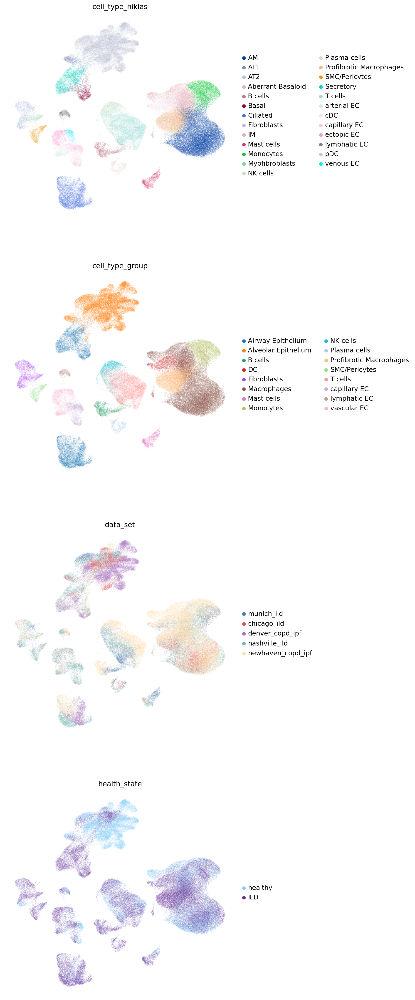

In [6]:
## overview UMAPs
sc.pl.umap(adata, color = ['cell_type_niklas',
                           'cell_type_group',
                           'data_set',
                           'health_state'], ncols = 1, frameon = False)

In [7]:
adata = adata[adata.obs.cell_type_niklas.isin(['Monocytes','AM','IM', 'Profibrotic Macrophages','cDC','pDC','Mast cells',
                                               'B cells','Plasma cells','T cells','NK cells'])]

Trying to set attribute `.obs` of view, copying.


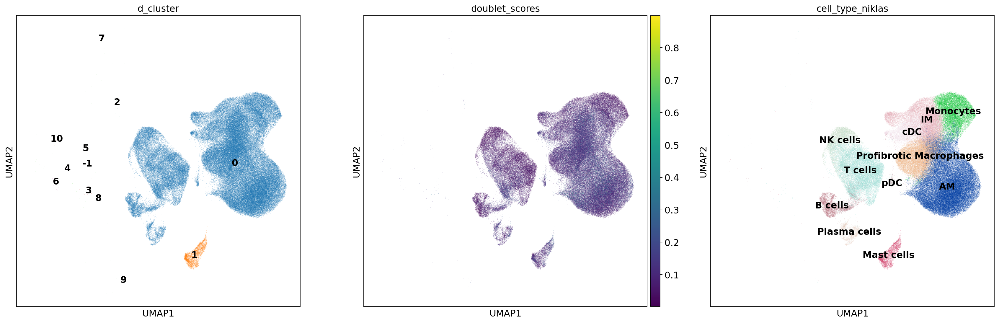

In [8]:
## using Herbert's old code snippet here
from natsort import natsorted
from sklearn.cluster import DBSCAN
def cluster_by_dscan(cords, eps, min_samples):
    clustering = DBSCAN(eps = eps, min_samples = min_samples).fit(cords)
    return clustering.labels_

adata.obs['d_cluster'] = cluster_by_dscan(adata.obsm['X_umap'], eps = 0.5, min_samples = 5)
c = adata.obs['d_cluster'].astype('U')
adata.obs['d_cluster'] = pd.Categorical(c, categories = natsorted(np.unique(c)))

sc.pl.umap(adata, color = ['d_cluster','doublet_scores','cell_type_niklas'], legend_loc='on data')

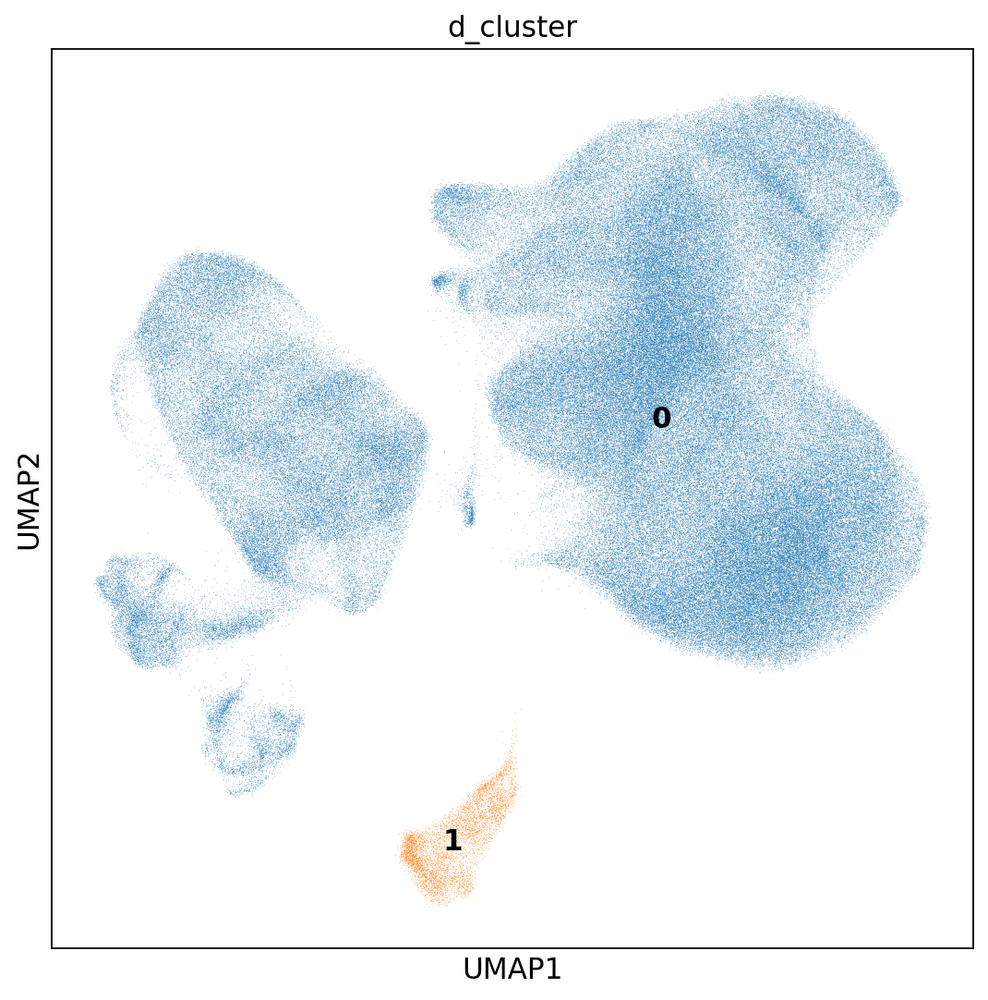

In [9]:
## discard outliers
adata = adata[adata.obs['d_cluster'].isin(['0','1'])].copy()
sc.pl.umap(adata, color = 'd_cluster', legend_loc='on data')

In [10]:
adata

AnnData object with n_obs × n_vars = 328410 × 61661
    obs: 'data_set', 'disease', 'enriched', 'health_state', 'in_integrated', 'name', 'patient', 'identifier', 'n_counts', 'n_genes', 'percent_mito', 'QC_group', 'doublet_scores', 'size_factors', 'S_score', 'G2M_score', 'phase', 'louvain_1', 'louvain_2', 'domain', 'cell_type', 'meta_celltype', 'patient_id', 'disease_long', 'age', 'age_status', 'gender', 'internal_id', 'smoke_status', 'ever_smoker', 'published_cell_type', 'published_category', 'integrated', 'disease_patient', 'dge_celltype', 'cell_type_group', 'cell_type_niklas', 'd_cluster'
    var: 'mean-0', 'std-0', 'mean-1', 'std-1', 'mean-2', 'std-2', 'mean-3', 'std-3', 'mean-4', 'std-4', 'highly_variable'
    uns: 'cell_type_colors', 'cell_type_group_colors', 'cell_type_niklas_colors', 'data_set_colors', 'dge_celltype_colors', 'domain_colors', 'health_state_colors', 'meta_celltype_colors', 'neighbors', 'pca', 'published_cell_type_colors', 'umap', 'd_cluster_colors'
    obsm: 'X_pc

### Figures for Supplementary Figures

In [11]:
adata.obs.cell_type_niklas.cat.categories

Index(['AM', 'B cells', 'IM', 'Mast cells', 'Monocytes', 'NK cells',
       'Plasma cells', 'Profibrotic Macrophages', 'T cells', 'cDC', 'pDC'],
      dtype='object')

In [12]:
## change order of cell type labels
adata.obs['cell_type_niklas'] = adata.obs['cell_type_niklas'].cat.reorder_categories(['Monocytes',
                                                                                      'AM',
                                                                                      'IM',
                                                                                      'Profibrotic Macrophages',
                                                                                      'cDC',
                                                                                      'pDC',
                                                                                      'Mast cells',
                                                                                      'B cells',
                                                                                      'Plasma cells',
                                                                                      'T cells',
                                                                                      'NK cells'])

In [13]:
def mysize(w, h, d):
    fig, ax = plt.subplots(figsize = (w, h), dpi = d)
    return(fig.gca())

In [14]:
cell_type_colours = ['#E41A1C','#377EB8','#4DAF4A','#984EA3','#FF7F00','#FFFF33','#A65628',
                     '#F781BF','#999999','#004301','#00FFFF']

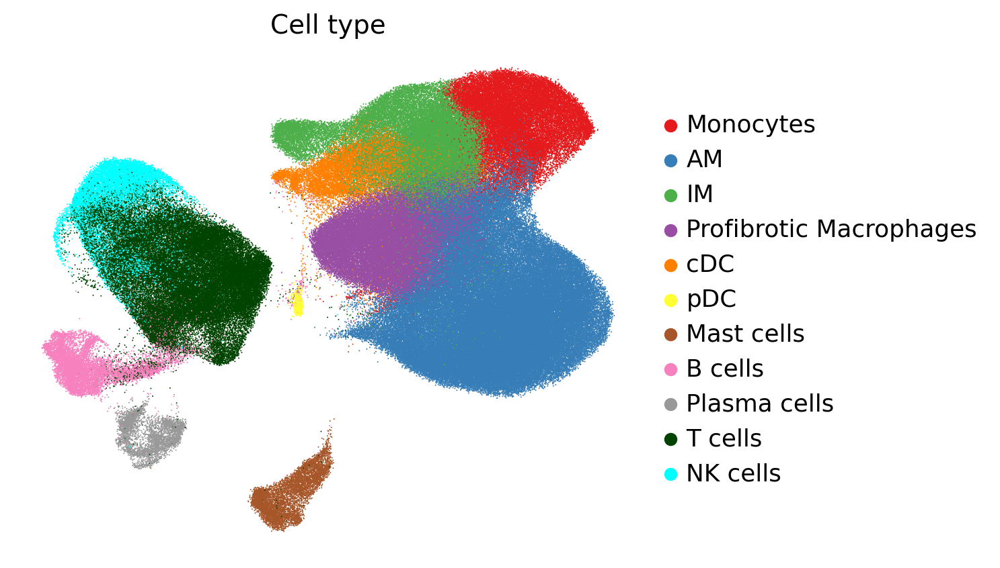

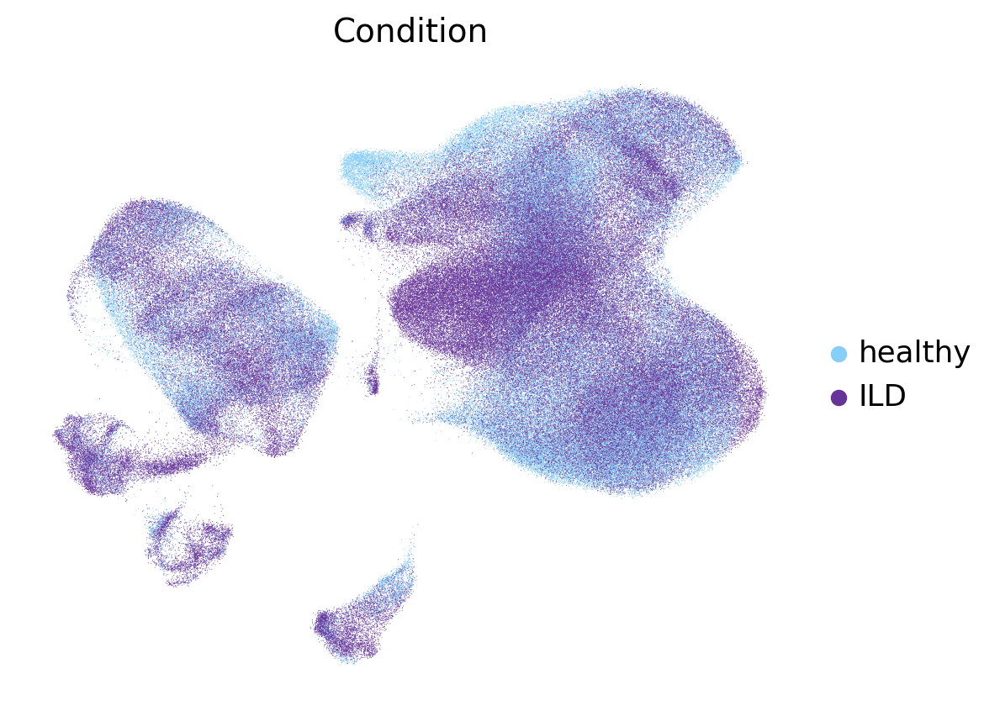

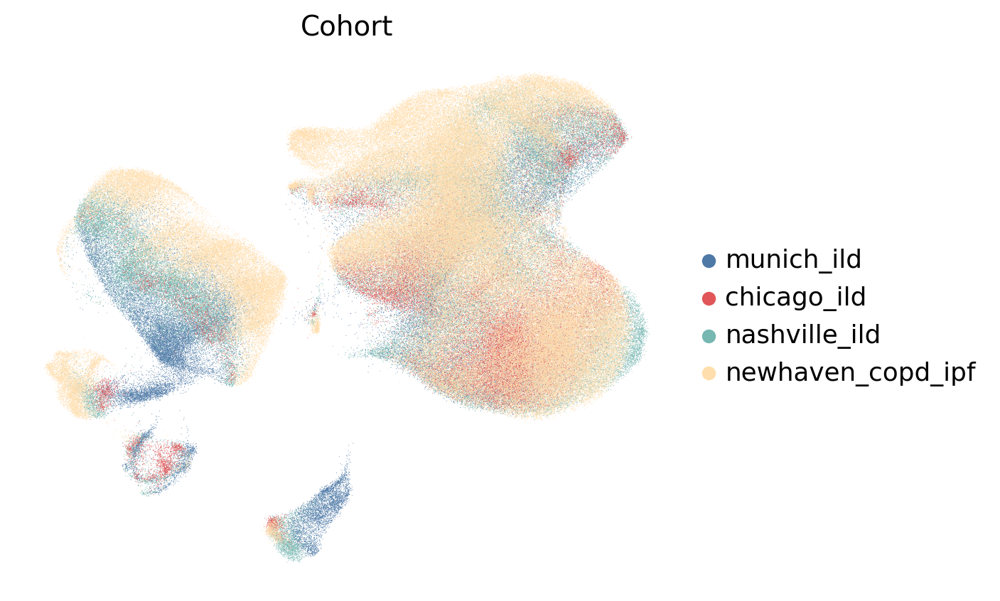

In [15]:
## save UMAPs
sc.pl.umap(adata, color = ['cell_type_niklas'], title = 'Cell type', frameon = False, size = 2, 
           palette = cell_type_colours,
           ax = mysize(6, 5, 100), save = '_celltype.pdf')

sc.pl.umap(adata, color = ['health_state'], title = 'Condition', frameon = False, size = 0.5,
           ax = mysize(6, 5, 100), save = '_condition.pdf')

sc.pl.umap(adata, color = ['data_set'], title = 'Cohort', frameon = False, size = 0.5,
           ax = mysize(6, 5, 100), save = '_cohort.pdf')

### Marker gene signature

In [16]:
## automated heatmap - based on scanpy's score, but we will use top markers based on score and log2FC
sc.tl.dendrogram(adata, groupby = 'cell_type_niklas')
sc.tl.rank_genes_groups(adata, groupby = 'cell_type_niklas', groups = 'all', use_raw = True, method = 'wilcoxon', n_genes=500)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cell_type_niklas']`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:22:58)


In [17]:
## create marker table
result = adata.uns['rank_genes_groups']
allMarkers = []
for cluster in result['names'].dtype.names:
    current = pd.DataFrame({'gene': result['names'][cluster], 'score': result['scores'][cluster],
                            'logfoldchange': result['logfoldchanges'][cluster], 'pval': result['pvals'][cluster],
                            'pval_adj': result['pvals_adj'][cluster], 'cell_type': cluster})
    allMarkers.append(current)
allMarkers = pd.concat(allMarkers)
allMarkers.head()

,gene,score,logfoldchange,pval,pval_adj,cell_type
0,FCN1,205.176392,5.176360,0.0,0.0,Monocytes
1,S100A8,198.481140,4.924150,0.0,0.0,Monocytes
2,S100A9,195.647293,4.144911,0.0,0.0,Monocytes
3,VCAN,176.642426,3.669922,0.0,0.0,Monocytes
4,NAMPT,171.145554,2.967349,0.0,0.0,Monocytes


In [18]:
## sort marker gene table by log FC and adjusted FC
allMarkers = allMarkers.sort_values(['cell_type','logfoldchange','score'], ascending=[True,False,True])
allMarkers.head()

,gene,score,logfoldchange,pval,pval_adj,cell_type
22,FABP4,278.866272,7.970584,0.0,0.0,AM
420,GPD1,115.348656,7.892939,0.0,0.0,AM
61,SERPING1,224.077698,7.225375,0.0,0.0,AM
363,PPIC,125.271812,7.026805,0.0,0.0,AM
92,LGALS3BP,202.601028,6.561071,0.0,0.0,AM


In [19]:
## save marker table
out_dir = '/home/niklas/projects/niche_environments_FIBROSIS/HUMAN_invivo/01_data/marker_table/'
allMarkers.to_csv(out_dir + '220111_CPC_IPF_reference_immune_markers_table_celltype.csv', index = False)

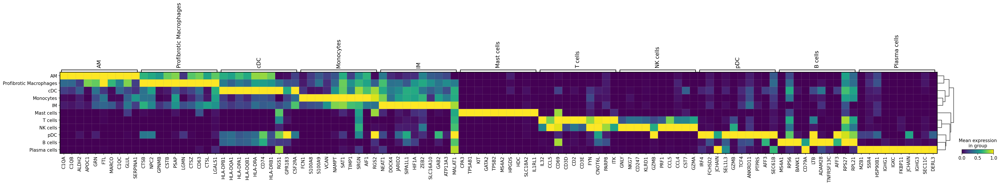

In [20]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes = 10, standard_scale = 'var',  save= 'auto_markers.pdf')

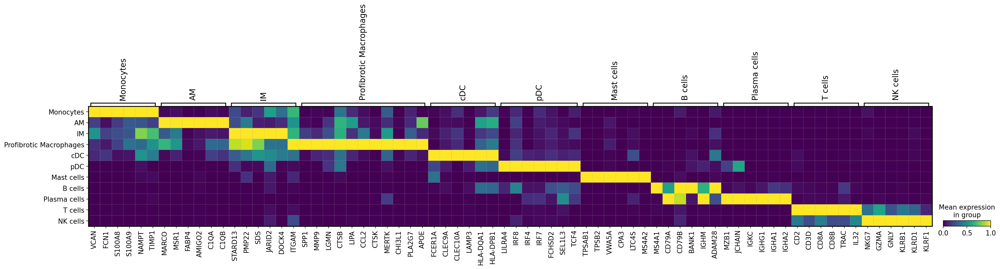

In [21]:
## custom heatmap
# matrixplot with marker genes
celltype_markers={'Monocytes' : ['VCAN','FCN1','S100A8','S100A9','NAMPT','TIMP1'],
                  'AM' : ['MARCO','MSR1','FABP4','AMIGO2','C1QA','C1QB'], #,'MCEMP1','C1QA','C1QB','C1QC'
                  'IM' : ['STARD13','PMP22','SDS','JARID2','DOCK4','ITGAM'],
                  'Profibrotic Macrophages' : ['SPP1','MMP9','LGMN','CTSB','LIPA','CCL2','CTSK','MERTK','CHI3L1','PLA2G7','APOE'],
                  'cDC' : ['FCER1A','CLEC9A','CLEC10A','LAMP3','HLA-DQA1','HLA-DPB1'],
                  'pDC' : ['LILRA4','IRF8','IRF4','IRF7','FCHSD2','SEL1L3','TCF4'],
                  'Mast cells' : ['TPSAB1','TPSB2','VWA5A','CPA3','LTC4S','MS4A2'],
                  'B cells' : ['MS4A1','CD79A','CD79B','BANK1','IGHM','ADAM28'],
                  'Plasma cells' : ['MZB1','JCHAIN','IGKC','IGHG1','IGHA1','IGHA2'],
                  'T cells' : ['CD2','CD3D','CD8A','CD8B','TRAC','IL32'],
                  'NK cells' : ['NKG7','GZMA','GNLY','KLRB1','KLRD1','KLRF1']             
}   

sc.pl.matrixplot(adata, celltype_markers, groupby = 'cell_type_niklas',standard_scale='var', dendrogram=False,
                     save='curated_markers.pdf' )

### Stacked bar plot to visualize changes in frequency

In [22]:
adata.obs['cell_type_niklas'] = ['DC' if ct in ['cDC','pDC'] else ct for ct in adata.obs['cell_type_niklas']]
adata.obs['cell_type_niklas'] = ['Macrophages' if ct in ['IM','AM'] else ct for ct in adata.obs['cell_type_niklas']]

In [23]:
adata = adata[-adata.obs.cell_type_niklas.isin(['Monocytes'])]

/home/niklas/miniconda3/envs/niche_fibrosis_env/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
/home/niklas/miniconda3/envs/niche_fibrosis_env/lib/python3.8/site-packages/anndata/_core/anndata.py:1236: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'cell_type_niklas' as categorical


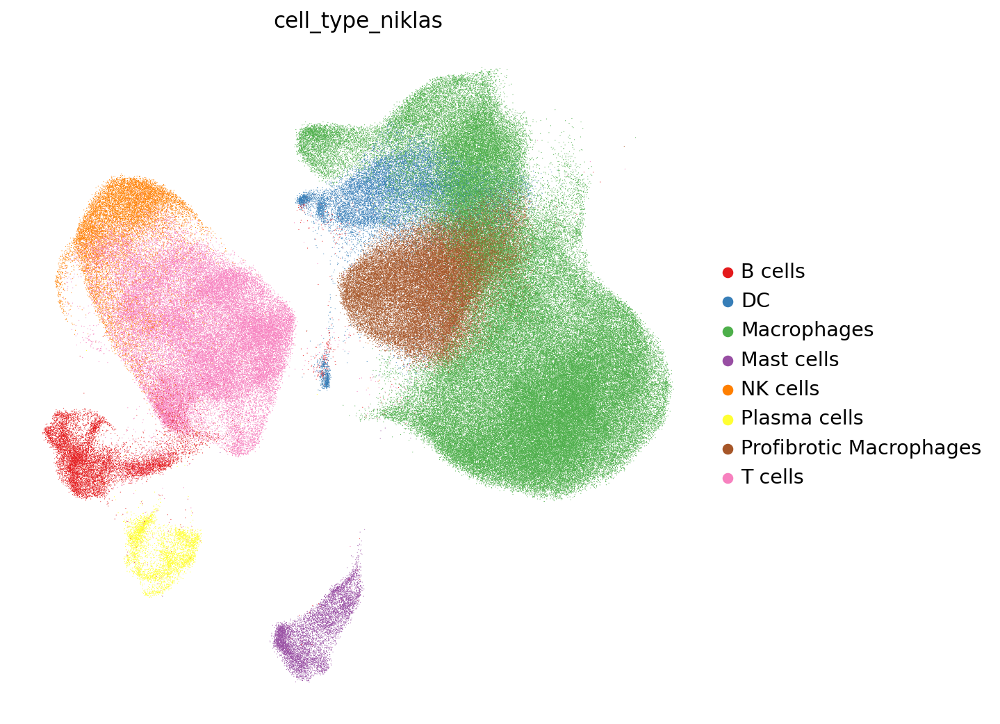

In [24]:
sc.pl.umap(adata, color = 'cell_type_niklas', frameon = False, palette = cell_type_colours, size = 1)

In [25]:
cell_type_colours = ['#E41A1C','#377EB8','#4DAF4A','#984EA3','#FF7F00','#FFFF33','#F781BF','#00FFFF']

In [26]:
## change order of cell type labels
adata.obs['cell_type_niklas'] = adata.obs['cell_type_niklas'].cat.reorder_categories(['Macrophages',
                                                                                      'Profibrotic Macrophages',
                                                                                      'DC',
                                                                                      'Mast cells',
                                                                                      'B cells',
                                                                                      'Plasma cells',
                                                                                      'T cells',
                                                                                      'NK cells'])

In [27]:
## frequency table no.1
adata.obs['cell_type_niklas'] = adata.obs['cell_type_niklas'].astype('category')
xlabel = 'health_state'
cell_types_label = 'cell_type_niklas'
cols = adata.uns['%s_colors' %cell_types_label]
celltypes = adata.obs[cell_types_label].cat.categories

relFreqs = sct.calc.relative_frequencies(adata, group_by = cell_types_label, xlabel = xlabel, condition = None)
relFreqs.head(2)

,Macrophages,Profibrotic Macrophages,DC,Mast cells,B cells,Plasma cells,T cells,NK cells,health_state
001C,0.707441,0.094801,0.054027,0.000000,0.027523,0.005097,0.043833,0.067278,healthy
002C,0.700176,0.156966,0.038801,0.003527,0.022928,0.000000,0.063492,0.014109,healthy


Saving Figure to /home/niklas/projects/niche_environments_FIBROSIS/HUMAN_invivo/02_figures/im
mune_subset/relfreqs_treatment.pdf

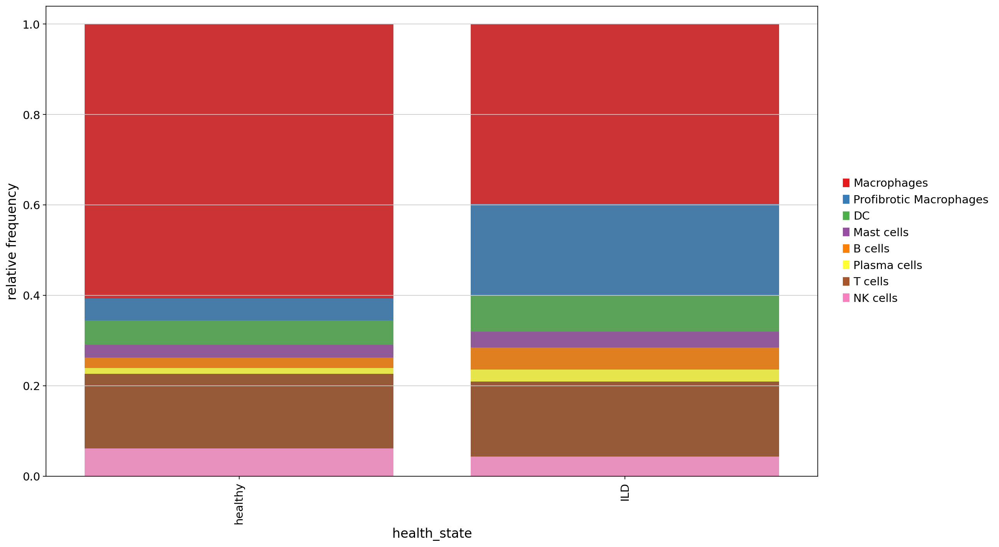

In [28]:
## cell type frequencies per treatment category
sct.plot.cluster_composition_stacked_barplot(relFreqs, xlabel = xlabel, figsize = (16,10), order = ['healthy','ILD'], colors = list(cols), width = 0.8,
                                            save='/home/niklas/projects/niche_environments_FIBROSIS/HUMAN_invivo/02_figures/immune_subset/relfreqs_treatment.pdf')